<a href="https://colab.research.google.com/github/Vinuthna06reddy/VinuthnaReddy_INFO5731_FALL2024/blob/main/INFO5731_Assignment_3_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **INFO5731 Assignment 3**

In this assignment, we will delve into various aspects of natural language processing (NLP) and text analysis. The tasks are designed to deepen your understanding of key NLP concepts and techniques, as well as to provide hands-on experience with practical applications.

Through these tasks, you'll gain practical experience in NLP techniques such as N-gram analysis, TF-IDF, word embedding model creation, and sentiment analysis dataset creation.

**Expectations**:
*   Use the provided .*ipynb* document to write your code & respond to the questions. Avoid generating a new file.
*   Write complete answers and run all the cells before submission.
*   Make sure the submission is "clean"; *i.e.*, no unnecessary code cells.
*   Once finished, allow shared rights from top right corner (*see Canvas for details*).


**Total points**: 100

**Deadline**: See Canvas

**Late Submission will have a penalty of 10% reduction for each day after the deadline.**


## Question 1 (30 points)

**Understand N-gram**

Write a python program to conduct N-gram analysis based on the dataset in your assignment two. You need to write codes from scratch instead of using any pre-existing libraries to do so:

(1) Count the frequency of all the N-grams (N=3).

(2) Calculate the probabilities for all the bigrams in the dataset by using the fomular count(w2 w1) / count(w2). For example, count(really like) / count(really) = 1 / 3 = 0.33.

(3) Extract all the noun phrases and calculate the relative probabilities of each review in terms of other reviews (abstracts, or tweets) by using the fomular frequency (noun phrase) / max frequency (noun phrase) on the whole dataset. Print out the result in a table with column name the all the noun phrases and row name as all the 100 reviews (abstracts, or tweets).

In [5]:
import csv
import re
from collections import Counter, defaultdict

# Load the dataset and extract the 'cleaned_review' column
dataset = []
with open('/content/final_cleaned_imdb_reviews.csv', 'r') as file:
    reader = csv.DictReader(file)
    for row in reader:
        dataset.append(row['cleaned_review'])

# (1) Count the frequency of all the trigrams (N=3)
def get_trigrams(text):
    words = re.findall(r'\b\w+\b', text.lower())
    return [tuple(words[i:i+3]) for i in range(len(words) - 2)]

trigram_counts = Counter()
for review in dataset:
    trigrams = get_trigrams(review)
    trigram_counts.update(trigrams)

print("Trigram Frequencies:")
for trigram, count in trigram_counts.items():
    print(f"{trigram}: {count}")

Streaming output truncated to the last 5000 lines.
('sit', 'in', 'a'): 22
('in', 'a', 'room'): 44
('a', 'room', 'and'): 22
('room', 'and', 'just'): 22
('and', 'just', 'spout'): 22
('just', 'spout', 'buzz'): 22
('spout', 'buzz', 'words'): 22
('buzz', 'words', 'like'): 22
('words', 'like', 'nuclear'): 22
('like', 'nuclear', 'war'): 22
('nuclear', 'war', 'economic'): 22
('war', 'economic', 'collapse'): 22
('economic', 'collapse', 'dogs'): 22
('collapse', 'dogs', 'and'): 22
('dogs', 'and', 'cats'): 22
('and', 'cats', 'living'): 22
('cats', 'living', 'together'): 22
('living', 'together', 'etcthat'): 22
('together', 'etcthat', 'said'): 22
('etcthat', 'said', 'its'): 22
('said', 'its', 'still'): 22
('its', 'still', 'an'): 22
('still', 'an', '810'): 22
('an', '810', 'tom'): 22
('810', 'tom', 'always'): 22
('tom', 'always', 'gives'): 22
('always', 'gives', 'it'): 22
('gives', 'it', 'his'): 22
('it', 'his', 'best'): 22
('his', 'best', 'the'): 22
('best', 'the', 'rest'): 22
('rest', 'of', 'the')

In [6]:
def get_bigrams(text):
    words = re.findall(r'\b\w+\b', text.lower())
    return [tuple(words[i:i+2]) for i in range(len(words) - 1)]

bigram_counts = Counter()
word_counts = Counter()

for review in dataset:
    words = re.findall(r'\b\w+\b', review.lower())
    bigrams = get_bigrams(review)
    bigram_counts.update(bigrams)
    word_counts.update(words)

# Calculate bigram probabilities
bigram_probabilities = {}
for (w1, w2), count in bigram_counts.items():
    if word_counts[w2] > 0:
        bigram_probabilities[(w1, w2)] = count / word_counts[w2]

print("\nBigram Probabilities:")
for bigram, prob in bigram_probabilities.items():
    print(f"{bigram}: {prob:.2f}")



Bigram Probabilities:
('man', 'i'): 0.03
('i', 'wish'): 0.33
('wish', 'i'): 0.02
('i', 'loved'): 1.00
('loved', 'this'): 0.01
('this', 'movie'): 0.36
('movie', 'more'): 0.04
('more', 'than'): 0.28
('than', 'i'): 0.02
('i', 'did'): 0.12
('did', 'dont'): 0.10
('dont', 'get'): 0.38
('get', 'me'): 0.07
('me', 'wrong'): 0.67
('wrong', 'its'): 0.06
('its', 'a'): 0.03
('a', 'solid'): 0.67
('solid', 'action'): 0.03
('action', 'movie'): 0.09
('movie', 'with'): 0.04
('with', 'jawdropping'): 1.00
('jawdropping', 'stunts'): 0.10
('stunts', 'some'): 0.05
('some', 'of'): 0.05
('of', 'the'): 0.09
('the', 'best'): 0.80
('best', 'in'): 0.02
('in', 'the'): 0.08
('the', 'series'): 0.29
('series', 'but'): 0.02
('but', 'as'): 0.01
('as', 'a'): 0.07
('a', 'mission'): 0.12
('mission', 'impossible'): 0.76
('impossible', 'movie'): 0.04
('movie', 'it'): 0.04
('it', 'felt'): 0.17
('felt', 'like'): 0.12
('like', 'a'): 0.02
('a', 'small'): 1.00
('small', 'step'): 0.50
('step', 'backward'): 1.00
('backward', 'for'

In [7]:
def extract_noun_phrases(text):
    # Split text into words
    words = re.findall(r'\b\w+\b', text.lower())
    noun_phrases = []

    # A simple heuristic: treat any two consecutive words as a "noun phrase"
    for i in range(len(words) - 1):
        noun_phrase = f"{words[i]} {words[i+1]}"
        noun_phrases.append(noun_phrase)

    return noun_phrases

# Frequency count for all noun phrases in the dataset
noun_phrase_counts = Counter()
review_noun_phrases = []

for review in dataset:
    noun_phrases = extract_noun_phrases(review)
    noun_phrase_counts.update(noun_phrases)
    review_noun_phrases.append(noun_phrases)

# Ensure that noun_phrase_counts is not empty
if noun_phrase_counts:
    max_freq = max(noun_phrase_counts.values())
    relative_probabilities = []

    for review_nouns in review_noun_phrases:
        relative_probs = {np: noun_phrase_counts[np] / max_freq for np in review_nouns}
        relative_probabilities.append(relative_probs)

    # Display results in a table format
    print("\nNoun Phrase Probabilities per Review")
    header = ["Review"] + list(noun_phrase_counts.keys())
    print("\t".join(header))
    for i, probs in enumerate(relative_probabilities):
        row = [f"{probs.get(np, 0):.2f}" for np in noun_phrase_counts.keys()]
        print(f"Review {i + 1}", "\t".join(row))
else:
    print("No noun phrases were found in the dataset.")



Noun Phrase Probabilities per Review
Review	man i	i wish	wish i	i loved	loved this	this movie	movie more	more than	than i	i did	did dont	dont get	get me	me wrong	wrong its	its a	a solid	solid action	action movie	movie with	with jawdropping	jawdropping stunts	stunts some	some of	of the	the best	best in	in the	the series	series but	but as	as a	a mission	mission impossible	impossible movie	movie it	it felt	felt like	like a	a small	small step	step backward	backward for	for the	the franchise	franchise fallout	fallout had	had mindblowing	mindblowing action	action sequences	sequences and	and stunt	stunt work	work along	along with	with developing	developing ethans	ethans relationship	relationship with	with ilsa	ilsa providing	providing closure	closure with	with julia	julia showing	showing the	the lengths	lengths ethan	ethan would	would go	go to	to protect	protect those	those closest	closest to	to him	him and	and battling	battling an	an imposing	imposing villain	villain dead	dead reckoning	rec

## Question 2 (25 points)

**Undersand TF-IDF and Document representation**

Starting from the documents (all the reviews, or abstracts, or tweets) collected for assignment two, write a python program:

(1) To build the documents-terms weights (tf * idf) matrix.

(2) To rank the documents with respect to query (design a query by yourself, for example, "An Outstanding movie with a haunting performance and best character development") by using cosine similarity.

Note: You need to write codes from scratch instead of using any pre-existing libraries to do so.

In [10]:
import csv
import math
import re
from collections import Counter, defaultdict

# Load the dataset and extract the 'cleaned_review' column
dataset = []
with open('/content/final_cleaned_imdb_reviews.csv', 'r') as file:
    reader = csv.DictReader(file)
    for row in reader:
        dataset.append(row['cleaned_review'])

# Preprocess text to tokenize and normalize words
def preprocess(text):
    return re.findall(r'\b\w+\b', text.lower())

# (1) Build the documents-terms weights (tf * idf) matrix
# Calculate Term Frequency (TF)
doc_terms = [preprocess(doc) for doc in dataset]
tf = [Counter(doc) for doc in doc_terms]

# Calculate Document Frequency (DF) for each term
df = Counter()
for terms in doc_terms:
    unique_terms = set(terms)
    for term in unique_terms:
        df[term] += 1

# Calculate TF-IDF
N = len(dataset)
tfidf_matrix = []
for doc_index, terms in enumerate(tf):
    doc_tfidf = {}
    for term, term_count in terms.items():
        tf_value = term_count / len(doc_terms[doc_index])  # TF for the term in the document
        idf_value = math.log(N / (1 + df[term]))  # IDF for the term
        doc_tfidf[term] = tf_value * idf_value
    tfidf_matrix.append(doc_tfidf)

query = "An outstanding movie with a haunting performance and best character development"
query_terms = preprocess(query)

# Compute TF-IDF for the query
query_tfidf = {}
query_tf = Counter(query_terms)
for term, term_count in query_tf.items():
    tf_value = term_count / len(query_terms)
    idf_value = math.log(N / (1 + df.get(term, 0)))  # IDF for the term in the query
    query_tfidf[term] = tf_value * idf_value

# Calculate cosine similarity between query and each document
def cosine_similarity(doc_tfidf, query_tfidf):
    # Calculate dot product and magnitudes
    dot_product = sum(doc_tfidf.get(term, 0) * query_tfidf.get(term, 0) for term in query_tfidf)
    doc_magnitude = math.sqrt(sum(value ** 2 for value in doc_tfidf.values()))
    query_magnitude = math.sqrt(sum(value ** 2 for value in query_tfidf.values()))

    if doc_magnitude == 0 or query_magnitude == 0:
        return 0.0
    return dot_product / (doc_magnitude * query_magnitude)

# Compute similarities and rank documents
similarities = [(i, cosine_similarity(tfidf_matrix[i], query_tfidf)) for i in range(N)]
ranked_documents = sorted(similarities, key=lambda x: x[1], reverse=True)

# Display ranking results
print("Document Ranking based on Query Similarity:")
for doc_index, similarity in ranked_documents:
    print(f"Document {doc_index + 1}: Similarity = {similarity:.4f}")






Document Ranking based on Query Similarity:
Document 1: Similarity = 0.0321
Document 26: Similarity = 0.0321
Document 51: Similarity = 0.0321
Document 76: Similarity = 0.0321
Document 101: Similarity = 0.0321
Document 126: Similarity = 0.0321
Document 151: Similarity = 0.0321
Document 176: Similarity = 0.0321
Document 201: Similarity = 0.0321
Document 226: Similarity = 0.0321
Document 251: Similarity = 0.0321
Document 276: Similarity = 0.0321
Document 301: Similarity = 0.0321
Document 326: Similarity = 0.0321
Document 351: Similarity = 0.0321
Document 376: Similarity = 0.0321
Document 401: Similarity = 0.0321
Document 426: Similarity = 0.0321
Document 451: Similarity = 0.0321
Document 476: Similarity = 0.0321
Document 501: Similarity = 0.0321
Document 526: Similarity = 0.0321
Document 22: Similarity = 0.0275
Document 47: Similarity = 0.0275
Document 72: Similarity = 0.0275
Document 97: Similarity = 0.0275
Document 122: Similarity = 0.0275
Document 147: Similarity = 0.0275
Document 172:

## Question 3 (25 points)

**Create your own word embedding model**

Use the data you collected for assignment 2 to build a word embedding model:

(1) Train a 300-dimension word embedding (it can be word2vec, glove, ulmfit, bert, or others).

(2) Visualize the word embedding model you created.

Reference: https://machinelearningmastery.com/develop-word-embeddings-python-gensim/

Reference: https://jaketae.github.io/study/word2vec/

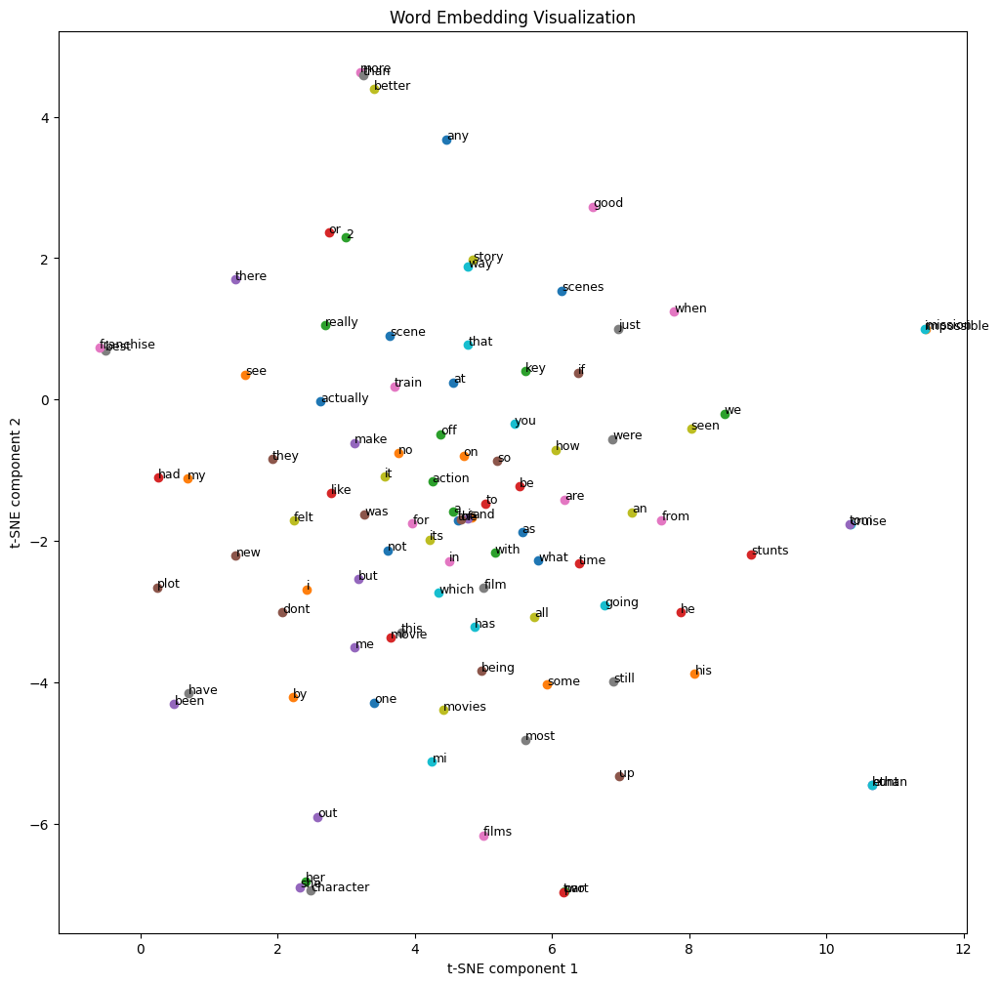

In [13]:
import csv
import re
import numpy as np
from gensim.models import Word2Vec
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

# Load the dataset and extract the 'cleaned_review' column
dataset = []
with open('/content/final_cleaned_imdb_reviews.csv', 'r') as file:
    reader = csv.DictReader(file)
    for row in reader:
        dataset.append(row['cleaned_review'])

# Data Preprocessing
def preprocess(text):
    return re.findall(r'\b\w+\b', text.lower())

# Tokenize each document
tokenized_docs = [preprocess(doc) for doc in dataset]

# (1) Train a 300-dimension Word2Vec model
embedding_dim = 300
word2vec_model = Word2Vec(sentences=tokenized_docs, vector_size=embedding_dim, window=5, min_count=2, sg=1, epochs=100)

# (2) Visualize the Word Embedding Model
def plot_word_embeddings(model, num_words=100):
    # Get the vocabulary words and their embeddings
    vocab = list(model.wv.index_to_key)[:num_words]
    word_vectors = np.array([model.wv[word] for word in vocab])  # Convert to NumPy array

    # Use t-SNE to reduce dimensions to 2D for visualization
    tsne = TSNE(n_components=2, random_state=0, perplexity=5)
    reduced_embeddings = tsne.fit_transform(word_vectors)

    # Plot the words in 2D space
    plt.figure(figsize=(12, 12))
    for i, word in enumerate(vocab):
        plt.scatter(reduced_embeddings[i, 0], reduced_embeddings[i, 1])
        plt.annotate(word, (reduced_embeddings[i, 0], reduced_embeddings[i, 1]), fontsize=9)
    plt.title("Word Embedding Visualization")
    plt.xlabel("t-SNE component 1")
    plt.ylabel("t-SNE component 2")
    plt.show()

# Display the plot
plot_word_embeddings(word2vec_model)


## Question 4 (20 Points)

**Create your own training and evaluation data for sentiment analysis.**

 **You don't need to write program for this question!**

 For example, if you collected a movie review or a product review data, then you can do the following steps:

*   Read each review (abstract or tweet) you collected in detail, and annotate each review with a sentiment (positive, negative, or neutral).

*   Save the annotated dataset into a csv file with three columns (first column: document_id, clean_text, sentiment), upload the csv file to GitHub and submit the file link blew.

*   This datset will be used for assignment four: sentiment analysis and text classification.


In [ ]:
# The GitHub link of your final csv file


# Link:



# Mandatory Question

Provide your thoughts on the assignment. What did you find challenging, and what aspects did you enjoy? Your opinion on the provided time to complete the assignment.

In [ ]:
# Type your answer